In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
import cv2
import numpy as np
import imutils
import tensorflow as tf
from sklearn.model_selection import train_test_split
import random
from skimage import io
import datetime

In [2]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [3]:
!kaggle datasets download mateuszbuda/lgg-mri-segmentation 

 98% 701M/714M [00:05<00:00, 128MB/s]
100% 714M/714M [00:05<00:00, 128MB/s]


In [ ]:
!unzip /content/lgg-mri-segmentation.zip

In [5]:
df = pd.read_csv("/content/lgg-mri-segmentation/kaggle_3m/data.csv")
#df.head()

In [6]:
PATH = "/content/lgg-mri-segmentation/kaggle_3m"
list_dir = []
for dir in os.listdir(PATH):
    dir = PATH + '/' + dir
    if os.path.isdir(dir):
        list_dir.append(dir)

In [7]:
MRI_image = []
MRI_mask = []
for i in range(len(list_dir)):
    directory_path = list_dir[i]
    for mask in os.listdir(directory_path):
        if '_mask' in mask:
            MRI_mask.append(directory_path + '/' + mask)
            mask = mask.replace('_mask','')
            MRI_image.append(directory_path + '/' + mask)



In [8]:
MRI_image[0],MRI_mask[0]

('/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7301_19911112/TCGA_DU_7301_19911112_20.tif',
 '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7301_19911112/TCGA_DU_7301_19911112_20_mask.tif')

In [9]:
len(MRI_image),len(MRI_mask),

(3929, 3929)

In [10]:
# Checking is all the images are proper files or not
for file in MRI_image:
    if not  os.path.isfile(file):
        print("error")

for file in MRI_mask:
    if not  os.path.isfile(file):
        print("error")

In [11]:
images_df = pd.DataFrame(data = zip(MRI_image,MRI_mask),columns= ['MRI_image', 'MRI_mask'])
images_df.head()

,MRI_image,MRI_mask
0,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...
1,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...
2,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...
3,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...
4,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...


In [12]:
images_df.shape

(3929, 2)

In total we have 3929 images and their respective masks.

##### Helper function

In [13]:
def plot_pair(image,mask):
    """
    Inputs: image and mask 
    Outputs: plot both image and plot side by side
    """
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(7, 5))
    axes[0].imshow(image)
    axes[0].get_xaxis().set_visible(False)
    axes[0].get_yaxis().set_visible(False)
    axes[1].imshow(mask)
    axes[1].get_xaxis().set_visible(False)
    axes[1].get_yaxis().set_visible(False)
    fig.tight_layout()

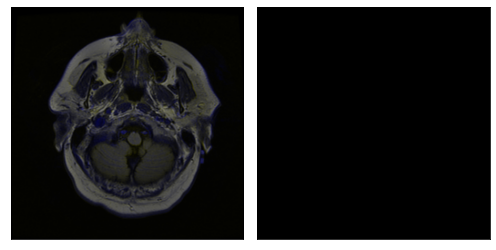

In [14]:
import cv2
image = cv2.imread(images_df['MRI_image'][4])
mask = cv2.imread(images_df['MRI_mask'][4])

plot_pair(image,mask)

In [15]:
def istumor(mask_img):
    """
    Finding wheather the mask has tumor or not
    """
    mask_img = cv2.imread(mask_img)
    k = np.max(mask_img)
    return 1 if k>0 else 0

In [16]:
images_df["is_tumor"] = images_df['MRI_mask'].apply(istumor)

In [17]:
images_df.head()

,MRI_image,MRI_mask,is_tumor
0,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1
1,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
2,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1
3,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
4,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0


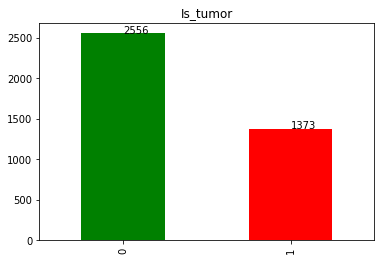

In [18]:
ax = images_df["is_tumor"].value_counts().plot(kind = "bar",title = "Is_tumor",color=['g','r'] )
for patch in ax.patches:
    #print(patch)
    ax.annotate(xy = (patch.get_x() + 0.25 ,patch.get_height()+0.5 ),s = str(patch.get_height()) )

In [19]:
print("Percentage of patients with no tumor", str( (images_df["is_tumor"].value_counts()[0]/ images_df["is_tumor"].value_counts().sum() ) *100) )
print("Percentage of patients with  tumor", str( (images_df["is_tumor"].value_counts()[1]/ images_df["is_tumor"].value_counts().sum() ) *100) )

Percentage of patients with no tumor 65.05472130313056
Percentage of patients with  tumor 34.94527869686943


In [20]:
no_tumor = images_df[images_df["is_tumor"] == 0 ].sample(3)
yes_tumor = images_df[images_df["is_tumor"] ==  1].sample(3)

In [21]:
no_tumor.index

Int64Index([1429, 2637, 869], dtype='int64')

In [23]:
no_tumor.loc[1429]

MRI_image    /content/lgg-mri-segmentation/kaggle_3m/TCGA_F...
MRI_mask     /content/lgg-mri-segmentation/kaggle_3m/TCGA_F...
is_tumor                                                     0
Name: 1429, dtype: object

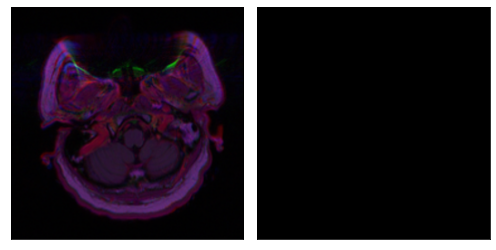

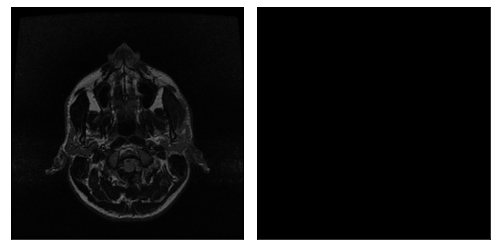

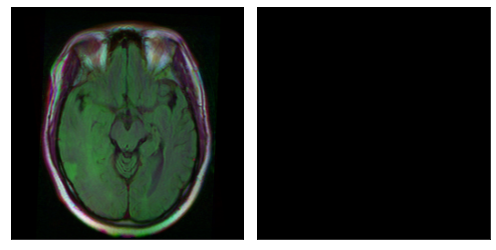

In [24]:
# Sample of no tumor 
for i in no_tumor.index:
    image = cv2.imread(no_tumor.loc[i]['MRI_image'])
    mask = cv2.imread(no_tumor.loc[i]['MRI_mask'])
    plot_pair(image,mask)

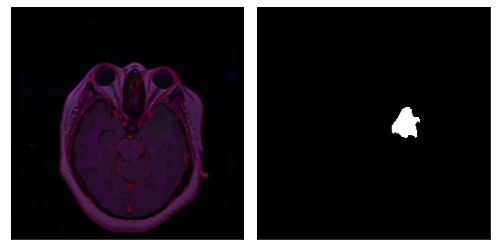

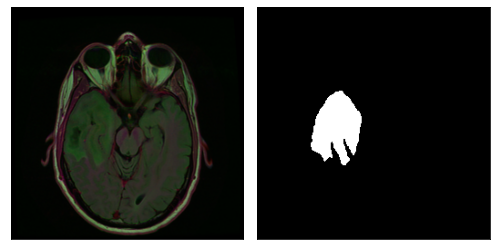

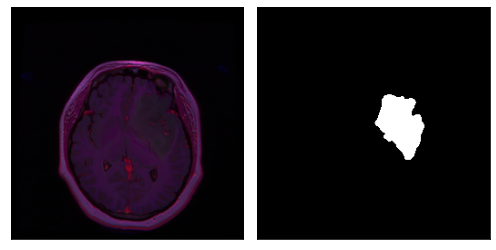

In [25]:
# Sample of  tumor images and mask
for i in yes_tumor.index:
    image = cv2.imread(yes_tumor.loc[i]['MRI_image'])
    mask = cv2.imread(yes_tumor.loc[i]['MRI_mask'])
    plot_pair(image,mask)

**Observations**


Not all brain scans are of same sizes , some brains are bigger and some are smaller in size.

Size of tumor also varies in the segmentation masks.

There are no segmentation masks present for scans with no tumor.

As 65% of patients have no tumor, it's reasonable to create a classification model to separate patients which are having tumors.

## Data augmentation



In [26]:
import cv2
image = cv2.imread(images_df['MRI_image'][4])
mask = cv2.imread(images_df['MRI_mask'][4])

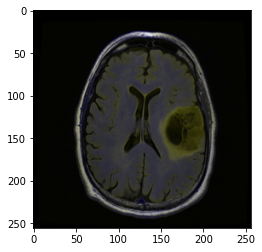

In [29]:
tiff_file = images_df['MRI_image'][0] # File path
I = cv2.imread(tiff_file)
tiff_file_mask = images_df['MRI_mask'][0] # File path
J = cv2.imread(tiff_file_mask)
plt.imshow(I)

(<matplotlib.image.AxesImage at 0x7f2bf5d9a810>, (256, 256, 3))

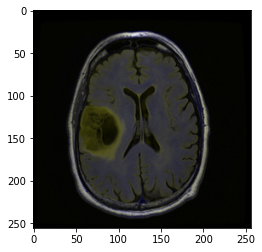

In [30]:
I = cv2.flip(I, flipCode= 1) # Flip value of 1 is for left to right flip
plt.imshow(I), I.shape

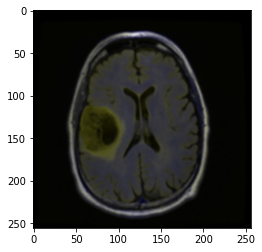

In [31]:
I = cv2.blur(I,(3,3)) # Blur operation will remove the sharpe edges in the image
plt.imshow(I)

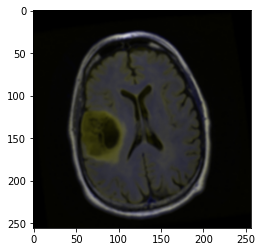

In [32]:
# Ref: https://stackoverflow.com/questions/9041681/opencv-python-rotate-image-by-x-degrees-around-specific-point
angle = np.random.randint(low= -20, high=20,)
w = 256
h = 256
M = cv2.getRotationMatrix2D((int(256/2), int(256/2)), angle,1)
I = cv2.warpAffine(I, M, (w, h))
plt.imshow(I)

(<matplotlib.image.AxesImage at 0x7f2bf613ca90>, (256, 256, 3))

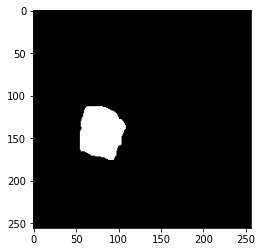

In [33]:
J = cv2.flip(J,flipCode= 1)
plt.imshow(J),J.shape

In [ ]:
cv2.imwrite('image.tif', J)

True

In [34]:
!mkdir augmented_data

In [35]:
abc = tiff_file[:-4] + '_' + "flip" + '.tif'  
abc = abc.replace('/content/lgg-mri-segmentation/kaggle_3m', '/content/augmented_data')
abc

'/content/augmented_data/TCGA_DU_7301_19911112/TCGA_DU_7301_19911112_20_flip.tif'

In [36]:
w = 256
h = 256
def image_augmentation(image_path, mask_path):
    """
    Takes the path of umage and mask and apply any one of the image augmentation and save the image

    """
    I = cv2.imread(image_path)
    J = cv2.imread(mask_path)
    oper = np.random.randint(low= 1, high=3)
    if oper == 1:
        #Flip image and mask
        opertation = "flip"
        I = cv2.flip(I, flipCode= 1) # Flip value of 1 is for left to right flip
        J = cv2.flip(J, flipCode= 1)
    if oper == 2:

        # Rotate Image and mask by a random angle  between a range
        opertation = "rotate"
        angle = np.random.randint(low= -20, high=20,)
        M = cv2.getRotationMatrix2D((int(256/2), int(256/2)), angle,1)
        I = cv2.warpAffine(I, M, (w, h))
        J = cv2.warpAffine(J, M, (w, h))
    
    if oper == 3:
        # Blur operation will remove the sharpe edges in the image
        opertation = "blur"
        I = cv2.blur(I,(3,3)) 
        J = cv2.blur(J,(3,3))

    return_image = image_path[:-4] + '_' + opertation + '.tif'
    return_image = return_image.replace('/content/lgg-mri-segmentation/kaggle_3m', '/content/augmented_data')
    dirname = os.path.dirname(return_image)

    if not os.path.exists(dirname):
        os.makedirs(dirname)

    return_mask_path = mask_path[:-4] + '_' + opertation + '.tif'
    return_mask_path = return_mask_path.replace('/content/lgg-mri-segmentation/kaggle_3m', '/content/augmented_data')
    dirname = os.path.dirname(return_mask_path)
    if not os.path.exists(dirname):
        os.makedirs(dirname)


    #print(return_image, return_mask_path)


    if not cv2.imwrite(return_image, I):
        print("Image not saved")
    if not cv2.imwrite( return_mask_path, J):
        print("mask not saved")
    MRI_image_aug.append(return_image)
    MRI_mask_aug.append(return_mask_path)



In [37]:
not_tumor_count = images_df["is_tumor"].value_counts()[0]
tumor_count = images_df["is_tumor"].value_counts()[1]
not_tumor_count,tumor_count

(2556, 1373)

Lets add 100 augmented images of no tumor and 500 + diffence between(no tumor and tumor) augmented images of tumor for balancing the dataset.

In [38]:
number_augmented_image = 100
difference  = not_tumor_count - tumor_count
no_tumor = images_df[images_df["is_tumor"] == 0 ].sample(number_augmented_image)
yes_tumor = images_df[images_df["is_tumor"] ==  1].sample(number_augmented_image + difference)
no_tumor.shape , yes_tumor.shape

((100, 3), (1283, 3))

In [39]:
no_tumor.head()

,MRI_image,MRI_mask,is_tumor
3665,/content/lgg-mri-segmentation/kaggle_3m/TCGA_F...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_F...,0
2549,/content/lgg-mri-segmentation/kaggle_3m/TCGA_F...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_F...,0
2797,/content/lgg-mri-segmentation/kaggle_3m/TCGA_F...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_F...,0
3172,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
2945,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0


In [40]:
MRI_image_aug = []
MRI_mask_aug = []
for idx in no_tumor.index:
    image_path = no_tumor['MRI_image'][idx]
    mask_path = no_tumor['MRI_mask'][idx]
    image_augmentation(image_path, mask_path)


In [41]:
MRI_image_aug[:5],MRI_mask_aug[:5]

(['/content/augmented_data/TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_49_rotate.tif',
  '/content/augmented_data/TCGA_FG_7643_20021104/TCGA_FG_7643_20021104_46_flip.tif',
  '/content/augmented_data/TCGA_FG_A60K_20040224/TCGA_FG_A60K_20040224_69_flip.tif',
  '/content/augmented_data/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_28_flip.tif',
  '/content/augmented_data/TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_18_flip.tif'],
 ['/content/augmented_data/TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_49_mask_rotate.tif',
  '/content/augmented_data/TCGA_FG_7643_20021104/TCGA_FG_7643_20021104_46_mask_flip.tif',
  '/content/augmented_data/TCGA_FG_A60K_20040224/TCGA_FG_A60K_20040224_69_mask_flip.tif',
  '/content/augmented_data/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_28_mask_flip.tif',
  '/content/augmented_data/TCGA_DU_5849_19950405/TCGA_DU_5849_19950405_18_mask_flip.tif'])

In [42]:
for idx in yes_tumor.index:
    image_path = yes_tumor['MRI_image'][idx]
    mask_path = yes_tumor['MRI_mask'][idx]
    image_augmentation(image_path, mask_path)

In [43]:
MRI_image_aug[0],MRI_mask_aug[0]

('/content/augmented_data/TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_49_rotate.tif',
 '/content/augmented_data/TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_49_mask_rotate.tif')

In [44]:
len(MRI_image_aug),len(MRI_mask_aug),

(1383, 1383)

In [45]:
# Checking is all the images are proper files or not
for file in MRI_image_aug:
    if not  os.path.isfile(file):
        print("error")

for file in MRI_mask_aug:
    if not  os.path.isfile(file):
        print("error")

In [46]:
aug_images_df = pd.DataFrame(data = zip(MRI_image_aug,MRI_mask_aug),columns= ['MRI_image', 'MRI_mask'])
aug_images_df.head()

,MRI_image,MRI_mask
0,/content/augmented_data/TCGA_FG_A4MT_20020212/...,/content/augmented_data/TCGA_FG_A4MT_20020212/...
1,/content/augmented_data/TCGA_FG_7643_20021104/...,/content/augmented_data/TCGA_FG_7643_20021104/...
2,/content/augmented_data/TCGA_FG_A60K_20040224/...,/content/augmented_data/TCGA_FG_A60K_20040224/...
3,/content/augmented_data/TCGA_DU_7298_19910324/...,/content/augmented_data/TCGA_DU_7298_19910324/...
4,/content/augmented_data/TCGA_DU_5849_19950405/...,/content/augmented_data/TCGA_DU_5849_19950405/...


In [47]:
aug_images_df.shape

(1383, 2)

In [48]:
def istumor(mask_img):
    """
    Finding wheather the mask has tumor or not
    """
    mask_img = cv2.imread(mask_img)
    k = np.max(mask_img)
    return 1 if k>0 else 0

In [49]:
aug_images_df["is_tumor"] = aug_images_df['MRI_mask'].apply(istumor)

In [50]:
aug_images_df.head()

,MRI_image,MRI_mask,is_tumor
0,/content/augmented_data/TCGA_FG_A4MT_20020212/...,/content/augmented_data/TCGA_FG_A4MT_20020212/...,0
1,/content/augmented_data/TCGA_FG_7643_20021104/...,/content/augmented_data/TCGA_FG_7643_20021104/...,0
2,/content/augmented_data/TCGA_FG_A60K_20040224/...,/content/augmented_data/TCGA_FG_A60K_20040224/...,0
3,/content/augmented_data/TCGA_DU_7298_19910324/...,/content/augmented_data/TCGA_DU_7298_19910324/...,0
4,/content/augmented_data/TCGA_DU_5849_19950405/...,/content/augmented_data/TCGA_DU_5849_19950405/...,0


In [51]:
# combining both the augmented and original dataset
total_df = pd.concat([images_df,aug_images_df], ignore_index= True)
total_df.head(),total_df.shape

(                                           MRI_image  ... is_tumor
 0  /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...  ...        1
 1  /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...  ...        0
 2  /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...  ...        1
 3  /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...  ...        0
 4  /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...  ...        0
 
 [5 rows x 3 columns], (5312, 3))

### distribution after augmentation.

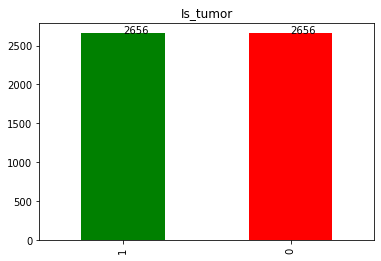

In [52]:
ax = total_df["is_tumor"].value_counts().plot(kind = "bar",title = "Is_tumor",color=['g','r'] )
for patch in ax.patches:
    #print(patch)
    ax.annotate(xy = (patch.get_x() + 0.25 ,patch.get_height()+0.5 ),s = str(patch.get_height()) )

In [53]:
print("Percentage of patients with no tumor", str( (total_df["is_tumor"].value_counts()[0]/ total_df["is_tumor"].value_counts().sum() ) *100) )
print("Percentage of patients with  tumor", str( (total_df["is_tumor"].value_counts()[1]/ total_df["is_tumor"].value_counts().sum() ) *100) )

Percentage of patients with no tumor 50.0
Percentage of patients with  tumor 50.0


Dataset is now almost evenly balanced

## Classification into tumor or not

Using a different model to create a classifier inot tumor and non tumor.

In [54]:
total_df['is_tumor']= total_df['is_tumor'].astype(str)

In [55]:
train_df , test_df = train_test_split(total_df[['MRI_image','is_tumor']],stratify = total_df['is_tumor'], test_size = 0.2 )

In [56]:
train_df.shape, test_df.shape

((4249, 2), (1063, 2))

In [57]:
train_df.head(), train_df.shape

(                                              MRI_image is_tumor
 806   /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...        0
 3832  /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...        1
 3652  /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...        1
 572   /content/lgg-mri-segmentation/kaggle_3m/TCGA_H...        0
 1512  /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...        0, (4249, 2))

In [58]:
#ref: https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator
from tensorflow.keras.preprocessing.image import ImageDataGenerator
BATCH_SIZE = 16

datagen = ImageDataGenerator(rescale=1./255., validation_split = 0.15)
                             #horizontal_flip=True,brightness_range=(-0.1,0.1),
                            

In [59]:
# NOTE: chnage class mode to binary as default mode is categorical
train_datagenerator = datagen.flow_from_dataframe(
    dataframe= train_df,
    x_col='MRI_image',y_col= 'is_tumor',subset="training",
    target_size=(256,256),class_mode="binary",batch_size = BATCH_SIZE
)

val_datagenerator = datagen.flow_from_dataframe(
    dataframe= train_df,
    x_col='MRI_image',y_col= 'is_tumor',subset="validation",
    target_size=(256,256),class_mode="binary",batch_size = BATCH_SIZE
)

test_datagenerator = datagen.flow_from_dataframe(
    dataframe= test_df,
    x_col='MRI_image',y_col= 'is_tumor',
    target_size=(256,256),class_mode="binary",batch_size = BATCH_SIZE
)

Found 3612 validated image filenames belonging to 2 classes.
Found 637 validated image filenames belonging to 2 classes.
Found 1063 validated image filenames belonging to 2 classes.


In [ ]:
next(train_datagenerator)[1].shape, next(train_datagenerator)[0].shape

((16,), (16, 256, 256, 3))

### Simple classifier


In [ ]:
# https://github.com/Nupurgopali/Brain-tumor-classification-using-CNN/blob/master/convolutional_neural_network.py

simple_classifer = tf.keras.models.Sequential()

simple_classifer.add(tf.keras.layers.Conv2D(filters=64, kernel_size=3, activation='relu', input_shape=[256, 256, 3]))
simple_classifer.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=1))

simple_classifer.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu'))
simple_classifer.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=1))

simple_classifer.add(tf.keras.layers.Flatten())

simple_classifer.add(tf.keras.layers.Dense(units=1, activation='sigmoid'))


In [ ]:
simple_classifer.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 254, 254, 64)      1792      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 253, 253, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 251, 251, 32)      18464     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 250, 250, 32)      0         
_________________________________________________________________
flatten (Flatten)            (None, 2000000)           0         
_________________________________________________________________
dense (Dense)                (None, 1)                 2000001   
Total params: 2,020,257
Trainable params: 2,020,257
Non-trainable params: 0
______________________________________________

In [ ]:
tf.keras.backend.clear_session()
!rm ./logs -r

In [ ]:
EarlyStopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', 
                                                          patience=5,verbose=1,
                                                          min_delta = 0.00001)
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.01,
                              patience=2,min_delta=0.01,verbose=1,
                               min_lr=1e-12)

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir= log_dir)

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001 ) # 0.001 deafault

In [ ]:

simple_classifer.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])

simple_classifer.fit(train_datagenerator, validation_data = val_datagenerator,
                     callbacks= [EarlyStopping_callback,reduce_lr,tensorboard_callback ],
                     epochs = 20)

Epoch 1/20
226/226 [==============================] - 36s 156ms/step - loss: 0.5852 - accuracy: 0.7638 - val_loss: 0.4964 - val_accuracy: 0.7771
Epoch 2/20
226/226 [==============================] - 35s 153ms/step - loss: 0.4139 - accuracy: 0.8317 - val_loss: 0.4219 - val_accuracy: 0.8085
Epoch 3/20
226/226 [==============================] - 35s 153ms/step - loss: 0.3018 - accuracy: 0.8801 - val_loss: 0.4123 - val_accuracy: 0.8226
Epoch 4/20
226/226 [==============================] - 35s 153ms/step - loss: 0.2080 - accuracy: 0.9236 - val_loss: 0.4773 - val_accuracy: 0.8242

Epoch 00004: ReduceLROnPlateau reducing learning rate to 1.0000000474974514e-05.
Epoch 5/20
226/226 [==============================] - 35s 154ms/step - loss: 0.1469 - accuracy: 0.9502 - val_loss: 0.3960 - val_accuracy: 0.8571
Epoch 6/20
226/226 [==============================] - 35s 154ms/step - loss: 0.1301 - accuracy: 0.9563 - val_loss: 0.3998 - val_accuracy: 0.8524
Epoch 7/20
226/226 [============================

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

## Segmentation


In [60]:
#Data for segmentation
#tumor_df  = images_df[images_df["is_tumor"] == '1']
tumor_df  = images_df[images_df["is_tumor"] == 1]
tumor_df.shape

(1373, 3)

In [61]:
X_train,X_val = train_test_split(total_df, test_size=0.2)
X_test,X_val = train_test_split(total_df, test_size=0.5)

print("Train data shape", X_train.shape)
print("Test data shape", X_test.shape)
print("Validation data shape", X_val.shape)

Train data shape (4249, 3)
Test data shape (2656, 3)
Validation data shape (2656, 3)


In [62]:
img_path = total_df[:5]['MRI_image'].values[2] 
mask_path = total_df[:5]['MRI_mask'].values[2]

In [63]:
img_path = total_df[-6:-5]['MRI_image'].values[0] 
mask_path = total_df[-6:-5]['MRI_mask'].values[0]

In [64]:
img_path,mask_path

('/content/augmented_data/TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_14_rotate.tif',
 '/content/augmented_data/TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_14_mask_rotate.tif')

In [67]:
img = io.imread(img_path)  # io.imread is failing after augmentation so use cv2.imread
mask = io.imread(mask_path)

In [68]:
img = cv2.imread(img_path)
mask = cv2.imread(mask_path)
img.shape, mask.shape

((256, 256, 3), (256, 256, 3))

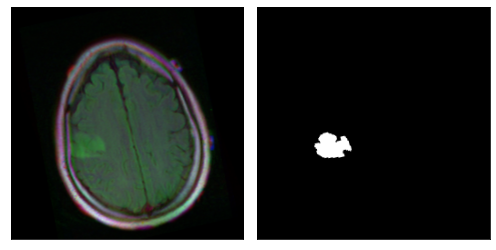

In [70]:
plot_pair(img,mask)

#### Datagenerator Class

In [71]:
#ref: https://stackoverflow.com/questions/63938312/keras-flow-from-dataframe-for-image-segmentation-i-e-with-a-binary-mask-as-lab  Nice work
# Better way is DataGernerator class
# ref: https://medium.com/analytics-vidhya/write-your-own-custom-data-generator-for-tensorflow-keras-1252b64e41c3
# ref: https://www.kaggle.com/tushifire/tumor-sign-detection-segmentation-resunet


class Datagenerator(tf.keras.utils.Sequence):
    def __init__(self,df, X_col,Y_col ,img_h , img_w ,batch_size = 16, shuffle = True):
        self.batch_size = batch_size
        self.df = df
        self.n = len(self.df)

        self.X_col = X_col
        self.Y_col = Y_col
        self.img_h = img_h
        self.img_w = img_w
        self.shuffle = shuffle
        self.on_epoch_end()


    def __len__(self):
        """
        It is returns the number of batches .
        Complusory method
        """
        return int( self.n/self.batch_size)

    
    def __getitem__(self, index):
        """
        Returns a batch of input image and its respective mask.
        """
        # Getting indices of length batcg size
        indices = self.indices[ index * self.batch_size : (index +1) * self.batch_size]

        X,Y = self.__data_generation(indices)

        return X,Y


    def on_epoch_end(self):
        """
        Shuffling indices after each epoch
        """
        self.indices = np.array(self.df.index) #np.arange(self.n)

        if self.shuffle:
            #self.indices = np.random.permutation( self.indices )
            np.random.shuffle(self.indices)

    def __data_generation(self,indices):
        """
        Return a single batch of (X,Y) of images and there segmentation mask
        with preprocessing applied.

        """
        X = np.empty((self.batch_size,self.img_h,self.img_w, 3 )) # input is 3 channel
        Y = np.empty((self.batch_size,self.img_h,self.img_w, 3 )) # mask is 1 channel

        for i in range(self.batch_size):
            idx = indices[i]
            img_path = str(self.df.loc[idx]['MRI_image'])

            mask_path = str(self.df.loc[idx]['MRI_mask'])

            img = cv2.imread(img_path)
            mask = cv2.imread(mask_path)

            # resize img and convert to array
            img = cv2.resize(img,(self.img_h, self.img_w))
            img = np.array(img, dtype = np.float64)

            # resize mask and convert to array
            mask = cv2.resize(mask,(self.img_h, self.img_w))
            mask = np.array(mask, dtype = np.float64)

            #standardising , This has improved the performance of model and images are better visible
            img -= img.mean()
            img /= img.std()

            mask -= mask.mean()
            mask /= mask.std()

            #print(i)
            #print(img.shape,mask.shape)

            X[i,] = img

            Y[i,] = mask # np.expand_dims(mask,axis = 2)

        Y = (Y > 0).astype(int)
        #print(X.shape,Y.shape)

        
        return X,Y



In [72]:
np.array(X_train.index)

array([ 753, 1850, 2861, ..., 2684, 1765, 4156])

In [73]:
idx = X_train.index[595]

In [74]:
img_h = 256
img_w = 256
img_path = str(X_train.loc[idx]['MRI_image'])

mask_path = str(X_train.loc[idx]['MRI_mask'])

img = cv2.imread(img_path)
mask = cv2.imread(mask_path)

# resize img and convert to array
img = cv2.resize(img,(img_h, img_w))
img = np.array(img, dtype = np.float64)

#resize mask and convert to array
mask = cv2.resize(mask,(img_h,img_w))
mask = np.array(mask, dtype = np.float64)

#standardising 
img -= img.mean()
img /= img.std()

mask -= mask.mean()
mask /= mask.std()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in true_divide


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


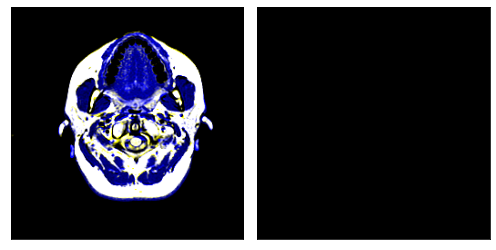

In [75]:
plot_pair(img,mask)

In [76]:
X_train.loc[2027]

MRI_image    /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...
MRI_mask     /content/lgg-mri-segmentation/kaggle_3m/TCGA_D...
is_tumor                                                     0
Name: 2027, dtype: object

In [77]:
train_data = Datagenerator(df = X_train ,X_col= "MRI_image", Y_col="MRI_mask",img_h = 256 , img_w = 256 )
val_data = Datagenerator(df = X_val ,X_col= "MRI_image", Y_col="MRI_mask",img_h = 256 , img_w = 256 )

In [78]:
train_data.__getitem__(4)[0].shape, train_data.__getitem__(4)[1].shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: RuntimeWarning: invalid value encountered in true_divide


((16, 256, 256, 3), (16, 256, 256, 3))

In [79]:
train_data.__getitem__(4)[0].shape, train_data.__getitem__(4)[1].shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: RuntimeWarning: invalid value encountered in true_divide


((16, 256, 256, 3), (16, 256, 256, 3))

In [80]:
path = '/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TS_19970726/TCGA_DU_A5TS_19970726_22.tif'
image = tf.keras.preprocessing.image.load_img(path)
image_arr = tf.keras.preprocessing.image.img_to_array(image)

#### Focal tversky loss to tackle class imbalance

ref: https://towardsdatascience.com/dealing-with-class-imbalanced-image-datasets-1cbd17de76b5

![](https://imgur.com/3Fz3Q0l.png)


By setting α >  𝜷 it penalizes FN more

The Focal Tversky Loss (FTL) is a generalisation of the tversky loss. The non-linear nature of the loss gives you control over how the loss behaves at different values of the tversky index obtained.




Best parameter will need some try and error.


Default paramenter that works as good starting point.


α = 0.7, 𝜷 = 0.3, γ = 3/4

### Unet model

In [81]:
#ref: https://github.com/nabsabraham/focal-tversky-unet/blob/master/losses.py

# ref: https://www.kaggle.com/bigironsphere/loss-function-library-keras-pytorch

from keras.losses import binary_crossentropy
import keras.backend as K
import tensorflow as tf

smooth=1e-6

def tversky(y_true, y_pred):
    y_true_pos = K.flatten(y_true)
    y_pred_pos = K.flatten(y_pred)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    y_true = tf.cast(y_true,tf.float32)
    y_pred = tf.cast(y_pred,tf.float32)
    #pt_1 = tversky(y_true, y_pred)
    #print(pt_1)
    gamma = 0.75
    return K.pow((1-tversky(y_true, y_pred)), gamma)


In [82]:
def resblock(X,filters):

    X_side = X
    X = tf.keras.layers.Conv2D(filters, kernel_size = (1,1))(X)
    X = tf.keras.layers.BatchNormalization()(X)
    X = tf.keras.layers.Activation("relu")(X)

    #padding='valid' is default
    X = tf.keras.layers.Conv2D(filters,padding='same', kernel_size = (3,3))(X)
    X = tf.keras.layers.BatchNormalization()(X)

    #side path
    X_side = tf.keras.layers.Conv2D(filters, kernel_size = (1,1))(X_side)
    X_side = tf.keras.layers.BatchNormalization()(X_side)

    # Adding both the path

    X = tf.keras.layers.Add()([X, X_side])
    X = tf.keras.layers.Activation("relu")(X)

    return X


def upsample(X,X_side):
    """
    Upsampling and concatination with the side path
    """

    X = tf.keras.layers.UpSampling2D((2,2))(X)
    concat = tf.keras.layers.Concatenate()([X,X_side])
    return concat

In [83]:
input_shape = (256,256,3)

input = tf.keras.Input(input_shape)

#Stage1
conv_1 = tf.keras.layers.Conv2D(16,padding='same', activation='relu', kernel_size = (3,3))(input)
conv_1 = tf.keras.layers.BatchNormalization()(conv_1)

conv_1 = tf.keras.layers.Conv2D(16,padding='same', activation='relu', kernel_size = (3,3))(conv_1)
conv_1 = tf.keras.layers.BatchNormalization()(conv_1)
pool_1 = tf.keras.layers.MaxPool2D((2,2))(conv_1)

#stage2
stage_2 = resblock(pool_1,32)
pool_2 = tf.keras.layers.MaxPool2D((2,2))(stage_2)

#stage3
stage_3 = resblock(pool_2,64)
pool_3 = tf.keras.layers.MaxPool2D((2,2))(stage_3)

#stage2
stage_4 = resblock(pool_3,128)
pool_4 = tf.keras.layers.MaxPool2D((2,2))(stage_4)


#bottle neck 
stage_5 = resblock(pool_4,256)


#upstage
print("stage_4 and stage_5" , stage_4.shape,stage_5.shape)

up_stage_1 = upsample(stage_5,stage_4)
#print(up_stage_1.shape)
up_stage_1 = resblock(up_stage_1,128)

print("up_stage_1 and stage_3" , up_stage_1.shape,stage_3.shape)

up_stage_2 = upsample(up_stage_1,stage_3)
up_stage_2 = resblock(up_stage_2,64)

print("up_stage_2 and stage_2" , up_stage_2.shape,stage_2.shape)

up_stage_3 = upsample(up_stage_2,stage_2)
up_stage_3 = resblock(up_stage_3,32)

print("up_stage_3 and conv_1" , up_stage_1.shape,conv_1.shape)
up_stage_4 = upsample(up_stage_3,conv_1)
up_stage_4 = resblock(up_stage_4,16)


output = tf.keras.layers.Conv2D(3,padding='same', activation='sigmoid', kernel_size = (1,1))(up_stage_4)
print(output.shape)


stage_4 and stage_5 (None, 32, 32, 128) (None, 16, 16, 256)
up_stage_1 and stage_3 (None, 32, 32, 128) (None, 64, 64, 64)
up_stage_2 and stage_2 (None, 64, 64, 64) (None, 128, 128, 32)
up_stage_3 and conv_1 (None, 32, 32, 128) (None, 256, 256, 16)
(None, 256, 256, 3)


In [84]:
segmentation_model = tf.keras.Model(input,output)
segmentation_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 256, 256, 16) 64          conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 16) 2320        batch_normalization[0][0]        
______________________________________________________________________________________________

In [ ]:
tf.keras.backend.clear_session()
!rm ./logs -r
!rm /content/Segmentation_model_Unet.hdf5

In [86]:
EarlyStopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', 
                                                          patience=5,verbose=1,
                                                          min_delta = 0.00001) # Reduce patience to 7
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1,
                              patience=2,min_delta=0.01,verbose=1,
                               min_lr=1e-12)
import datetime
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
#tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir= log_dir)


check_point = tf.keras.callbacks.ModelCheckpoint('Segmentation_Unet.hdf5', monitor='val_loss', verbose=1, save_best_only=True )

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001 ) # 0.001 deafault

In [87]:
segmentation_model.compile(optimizer = optimizer, 
                  loss = focal_tversky, 
                  metrics = [tversky]
                 )

In [88]:
model_hist = segmentation_model.fit(train_data, validation_data = val_data,
          callbacks= [EarlyStopping_callback,check_point,reduce_lr,tensorboard_callback ],epochs = 30)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 1/30
265/265 [==============================] - 151s 442ms/step - loss: 0.7001 - tversky: 0.3675 - val_loss: 0.6287 - val_tversky: 0.4583

Epoch 00001: val_loss improved from inf to 0.62868, saving model to Segmentation_Unet.hdf5
Epoch 2/30
265/265 [==============================] - 116s 437ms/step - loss: 0.3750 - tversky: 0.7256 - val_loss: 0.4102 - val_tversky: 0.6930

Epoch 00002: val_loss improved from 0.62868 to 0.41019, saving model to Segmentation_Unet.hdf5
Epoch 3/30
265/265 [==============================] - 116s 437ms/step - loss: 0.3177 - tversky: 0.7792 - val_loss: 0.3237 - val_tversky: 0.7733

Epoch 00003: val_loss improved from 0.41019 to 0.32367, saving model to Segmentation_Unet.hdf5
Epoch 4/30
265/265 [==============================] - 116s 437ms/step - loss: 0.2977 - tversky: 0.7968 - val_loss: 0.2818 - val_tversky: 0.8107

Epoch 00004: val_loss improved from 0.32367 to 0.28184, saving model to Segmentation_Unet.hdf5
Epoch 5/30
265/265 [========================

In [89]:
model_hist.history.keys()

dict_keys(['loss', 'tversky', 'val_loss', 'val_tversky', 'lr'])

In [90]:
segmentation_model_save = segmentation_model.to_json()

with open("segmentation_model_Unet.json", "w") as json_file:
    json_file.write(segmentation_model_save)

/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


In [ ]:
encoder = tf.keras.Model(inputs=input, outputs=stage_5)
#plot_model(encoder, 'encoder_compress.png', show_shapes=True)
# save the encoder to file
encoder.save('encoder_Unet.h5')

### Plotting performance of model

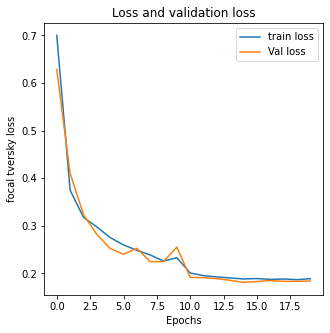

In [92]:
plt.figure(figsize=(5,5))
plt.title("Loss and validation loss")
plt.xlabel("Epochs")
plt.ylabel("focal tversky loss")
plt.plot(model_hist.history['loss'])
plt.plot(model_hist.history['val_loss'])
plt.legend(['train loss','Val loss'])

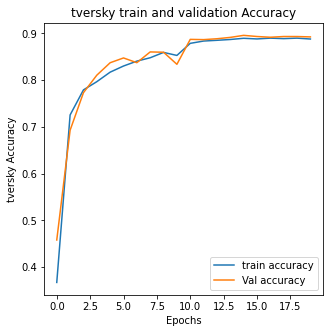

In [93]:
plt.figure(figsize=(5,5))
plt.title("tversky train and validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("tversky Accuracy")
plt.plot(model_hist.history['tversky'])
plt.plot(model_hist.history['val_tversky'])
plt.legend(['train accuracy','Val accuracy'])

In [94]:
test_data =  Datagenerator(df = X_test ,X_col= "MRI_image", Y_col="MRI_mask",img_h = 256 , img_w = 256 )


In [95]:
segmentation_model.evaluate(test_data)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:82: RuntimeWarning: invalid value encountered in true_divide


166/166 [==============================] - 22s 131ms/step - loss: 0.1960 - tversky: 0.8816


[0.19602026045322418, 0.8815617561340332]

In [96]:
predictions = segmentation_model.predict(test_data)

#### Prediction of segmentation mask


In [100]:
X_test.head()

,MRI_image,MRI_mask,is_tumor
2847,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,1
4035,/content/augmented_data/TCGA_DU_6399_19830416/...,/content/augmented_data/TCGA_DU_6399_19830416/...,1
4236,/content/augmented_data/TCGA_HT_A61A_20000127/...,/content/augmented_data/TCGA_HT_A61A_20000127/...,1
3353,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0
3913,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,/content/lgg-mri-segmentation/kaggle_3m/TCGA_D...,0


In [101]:
ind = X_test.index
X_test.loc[ind[0]]['MRI_image']

'/content/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7306_19930512/TCGA_DU_7306_19930512_20.tif'

In [102]:
def predict_segmentation_mask(image_path):
    # reads an brain MRI image
    img = cv2.imread(image_path)
    img = cv2.resize(img,(256,256))
    img = np.array(img, dtype=np.float64)
    img -= img.mean()
    img /= img.std()
    #img = np.reshape(img, (1,256,256,3) # this is the shape our model expects
    X = np.empty((1,256,256,3))
    X[0,] = img
    predict = segmentation_model.predict(X)

    return predict.reshape(256,256,3)



In [103]:
image_path = X_test.loc[ind[8]]['MRI_image']
original_mask = X_test.loc[ind[8]]['MRI_mask']
image_orignal = cv2.imread(image_path)
original_mask = cv2.imread(original_mask)
predicted_mask = predict_segmentation_mask(image_path)

In [104]:
def plot_mask_pair(original_mask,predicted_mask):
    """
    Inputs: image and mask 
    Outputs: plot both image and plot side by side
    """
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(7, 5))
    axes[0].imshow(original_mask)
    axes[0].get_xaxis().set_visible(False)
    axes[0].get_yaxis().set_visible(False)
    axes[1].imshow(predicted_mask)
    axes[1].get_xaxis().set_visible(False)
    axes[1].get_yaxis().set_visible(False)
    fig.tight_layout()

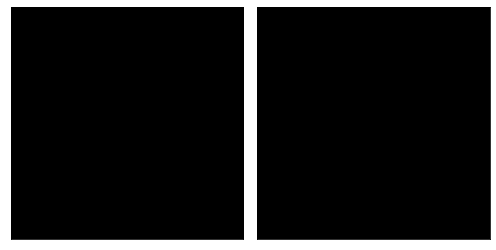

In [105]:
plot_mask_pair(original_mask,predicted_mask)

Some sample predictions

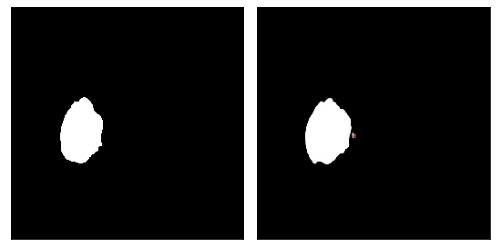

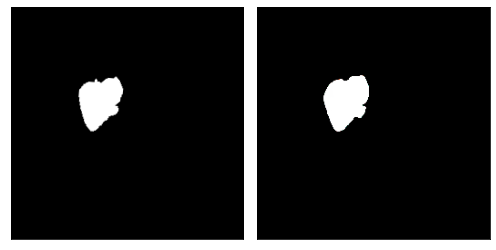

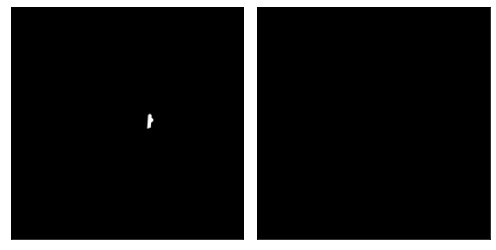

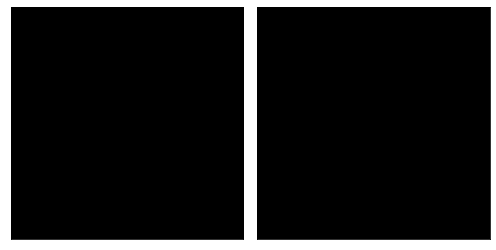

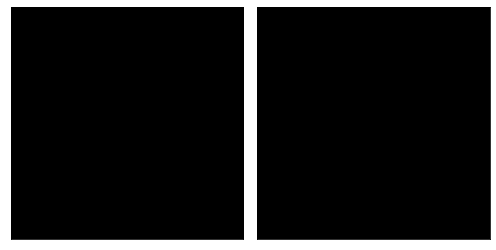

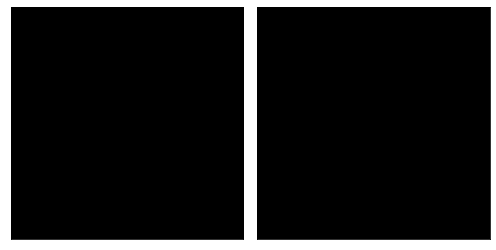

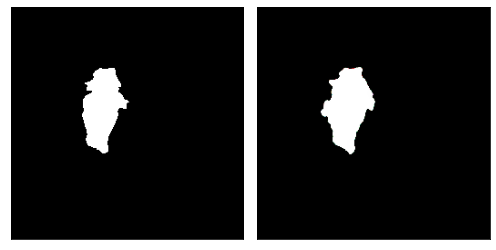

In [106]:
for i in range(7):
    image_path = X_test.loc[ind[i]]['MRI_image']
    original_mask = X_test.loc[ind[i]]['MRI_mask']
    original_mask = cv2.imread(original_mask)
    predicted_mask = predict_segmentation_mask(image_path)
    plot_mask_pair(original_mask,predicted_mask)


The above model is trained with both MRI images containing Tumor and not.

I do not think here we needed another model to classify images into tumor and non tummor as that can be done simply keeping a threshold to the percentage of segmentation mask that is (White).

Eg: if more than 5% of segmentation mask contains white pixels then it contains tummor otherwise it does not contain.


## Classification Using a threshold as percentage of white pixels in segmentation model.



In [176]:

def threshold_classifier(mask):
    #mask_img = cv2.imread(mask_img)

    k = np.max(mask)
    return 1 if k > 0.5 else 0


In [173]:
256*256

65536

In [177]:
i = 500
image_path = X_test.loc[ind[i]]['MRI_image']
original_mask = X_test.loc[ind[i]]['MRI_mask']
original_mask = cv2.imread(original_mask)
predicted_mask = predict_segmentation_mask(image_path)

In [178]:
np.max(predicted_mask) , np.min(predicted_mask)

(0.002344002, 1.3825276e-08)

In [169]:
threshold_classifier(predicted_mask)

0

In [179]:
class_predictions = []
class_actual = []

for i in range(len(ind)):
    image_path = X_test.loc[ind[i]]['MRI_image']
    original_mask = X_test.loc[ind[i]]['MRI_mask']
    original_mask = cv2.imread(original_mask)
    predicted_mask = predict_segmentation_mask(image_path)
    predicted_class = threshold_classifier( predicted_mask )
    class_predictions.append( predicted_class )


In [180]:
len(class_predictions)
class_actual = [ int(i) for i in X_test['is_tumor'].values]

In [181]:
from sklearn.metrics import accuracy_score
accuracy_score(class_predictions , class_actual)

0.9457831325301205

Achieved a accuracy score of 94% , which is way better than our separate model.

### Checking some failed examples


In [184]:
failed_ex = []
for i in range(len(class_predictions)):
    if class_predictions[i] != class_actual[i]:
        failed_ex.append(i)


In [192]:
def plot_mask_image(original_mask,predicted_mask,oringnal_image):
    """
    Inputs: image and mask 
    Outputs: plot both image and plot side by side
    """
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10, 10))
    axes[0].imshow(original_mask)
    axes[0].get_xaxis().set_visible(False)
    axes[0].get_yaxis().set_visible(False)
    axes[1].imshow(predicted_mask)
    axes[1].get_xaxis().set_visible(False)
    axes[1].get_yaxis().set_visible(False)

    axes[2].imshow(oringnal_image)
    axes[2].get_xaxis().set_visible(False)
    axes[2].get_yaxis().set_visible(False)
    fig.tight_layout()

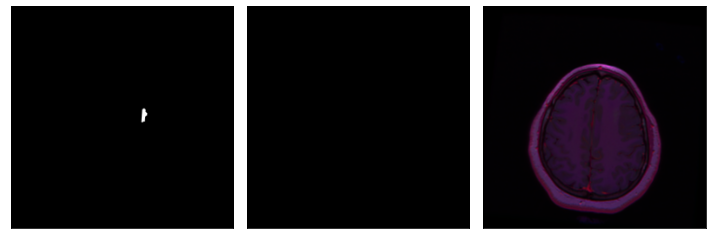

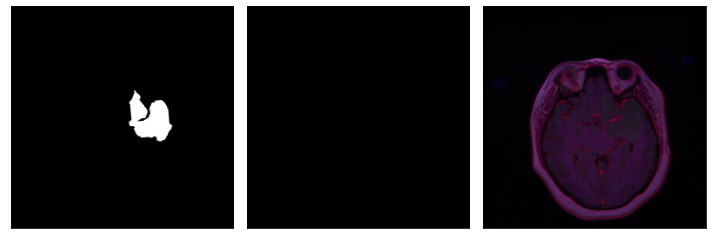

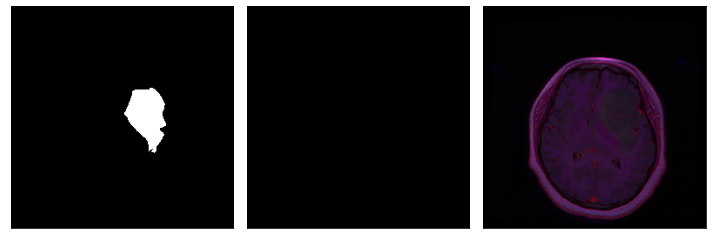

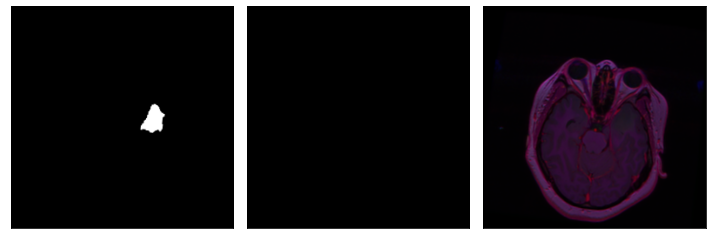

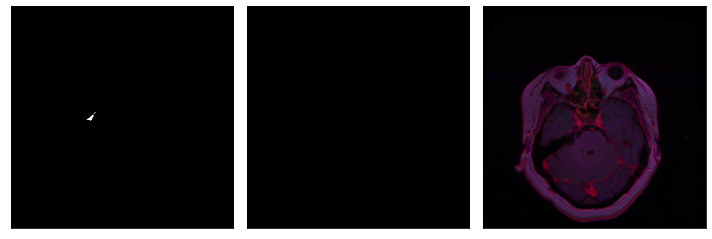

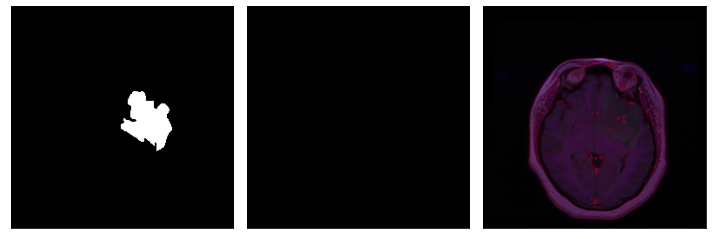

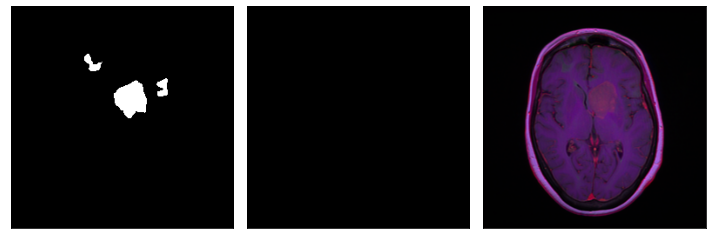

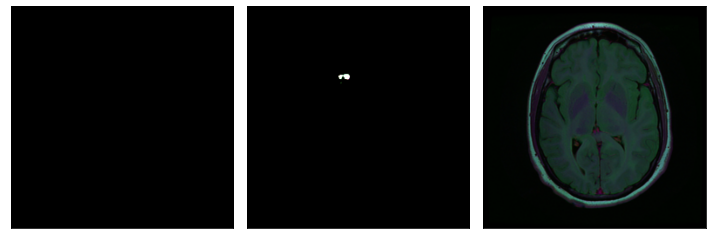

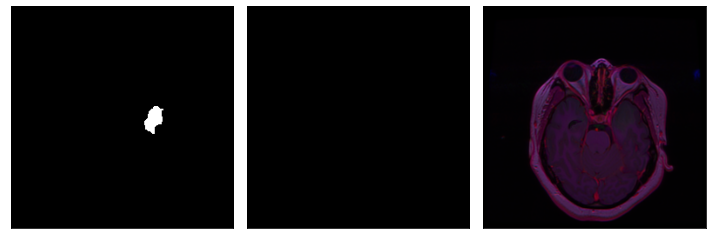

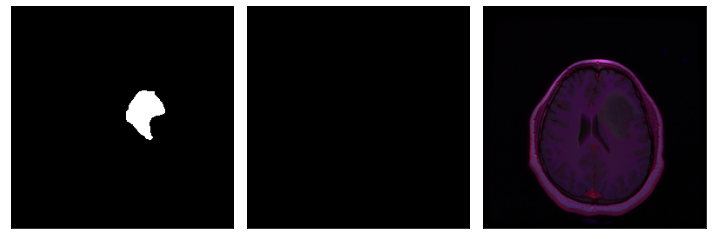

In [194]:
failed_ex[:5]
for i in failed_ex[:10]:
    image_path = X_test.loc[ind[i]]['MRI_image']
    original_mask = X_test.loc[ind[i]]['MRI_mask']
    original_mask = cv2.imread(original_mask)
    predicted_mask = predict_segmentation_mask(image_path)
    oringnal_image = cv2.imread(image_path)
    plot_mask_image(original_mask,predicted_mask,oringnal_image)

Most of the wrongly classifed MRI scans have either very low  tumor size or MRI image are in voilet colour and there is very little contrast between the tummor and the rest of the image.